In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
pip install catboost

In [ ]:
import numpy as np
import pandas as pd 
import seaborn as sns
from matplotlib import pyplot as plt 

In [ ]:
path = "/content/drive/MyDrive/intro_to_ds/"
file = 'Train.csv'
!cp /content/drive/MyDrive/intro_to_ds/Train.csv /content/

In [323]:
df = pd.read_csv(file, index_col=0)

In [ ]:
!cp /content/drive/MyDrive/intro_to_ds/VariableDefinitions.csv /content/
definitions = pd.read_csv('VariableDefinitions.csv', index_col=0)
definitions

,Unnamed: 1,Unnamed: 2
Variable Definitions,,
NaN,French,English
NaN,Le dataset churn comprend 19 variables dont 15...,The churn dataset includes 19 variables includ...
user_id,NaN,NaN
REGION,la localité de chaque client,the location of each client
TENURE,la durée dans le reseau,duration in the network
MONTANT,montant de recharge,top-up amount
FREQUENCE_RECH,nombre de fois que le client a fait une recharge,number of times the customer refilled
REVENUE,revenu mensuel de chaque client,monthly income of each client
ARPU_SEGMENT,revenu sur 90 jours/3,income over 90 days / 3


Let us notice that there are two pairs of almost identical features 

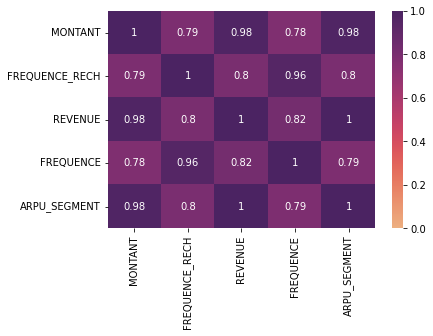

In [296]:
a = df[['MONTANT', 'FREQUENCE_RECH', 'REVENUE', 'FREQUENCE', 'ARPU_SEGMENT']].corr()
sns.heatmap(a, vmin=0, vmax=1, annot=True, cmap="flare")

Further we fill missing number in the table

In [324]:
df['TOP_PACK'].fillna('NO_PACK',inplace=True)
df['REGION'].fillna('Unknown',inplace=True)
fill_nans_columns = ['REVENUE', 'FREQUENCE', 'DATA_VOLUME','ON_NET',
                     'ORANGE',
                      'TIGO',
                    'REGULARITY',
                    'FREQ_TOP_PACK']
for col in fill_nans_columns:
  df[col].fillna(0,inplace=True)

In [325]:
df['ZONE1'].fillna(0,inplace=True)
df['ZONE2'].fillna(0,inplace=True)

Create a new feature 'PACK_CAT' basing on the frequency of different values in the column 'TOP_PACK'

In [306]:
freq = pd.DataFrame(df.TOP_PACK.value_counts())
df['PACK_CAT'] = df['TOP_PACK'].apply(lambda x: freq.loc[x][0])
def top_pack_cat_func(x):
  if x <= 1492:
    return 0
  else:
    return 1
df['PACK_CAT'] = df['PACK_CAT'].apply(lambda x: top_pack_cat_func(x) )

In [318]:
df[['PACK_CAT', 'CHURN']].corr()

,CHURN
CHURN,1.0


We drop feature 'PACK_CAT' because it has low correlation with target value and 'MRG' because it is constant for all users in the dataset.

In [ ]:
columns_to_drop = ['MONTANT', 'FREQUENCE_RECH', 'MRG', 'PACK_CAT']
for col in columns_to_drop:
    df = df.drop(labels = [col], axis=1) 

Create feature 'REGULARITY_CAT' according to the visual analysis of the distribution of the feature 'REGULARUTY'

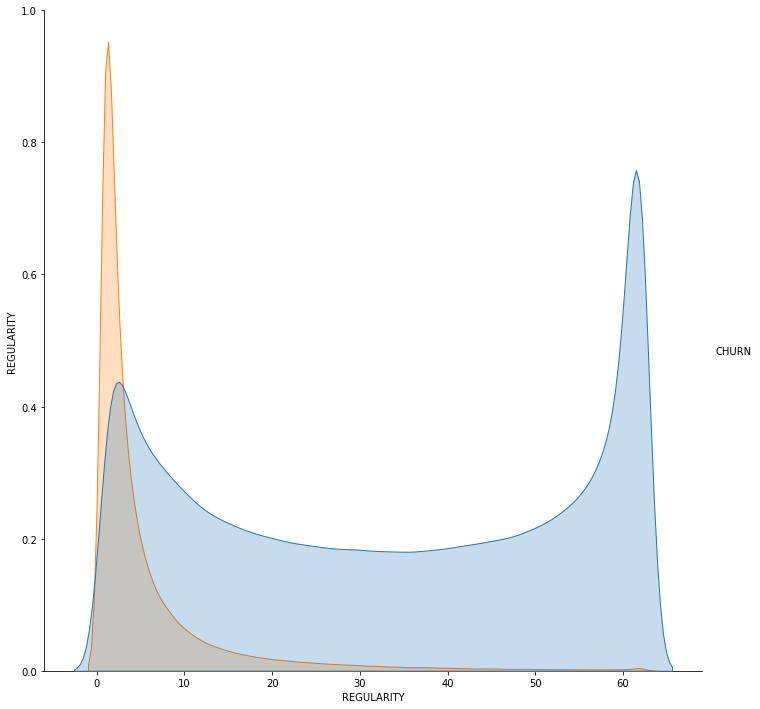

In [305]:
sns.pairplot(df[['REGULARITY', 'CHURN']], hue='CHURN', height=10)

In [327]:
def cat_func(x):
  if x <= 12:
    return 1
  else:
    return 0
df['REGULARITY_CAT'] = df['REGULARITY'].apply(lambda x: cat_func(x))

In [ ]:
# pack_cols = ['packs_' + name for name in Names]
# df.drop(pack_cols, inplace=True, axis=1)
# Names = ['=', 'd', 'Data', 'Daily', 'MIXT']

We extract new features from the column 'TOP_PACK', these are binary features showing if the client uses some popular data pack or not

In [328]:
Names = ['=', 'GB', 'd', 'Data', 'Daily', 'MIXT', 'NO_PACK', 'net']
lsts = [[] for _ in range(len(Names))]
values = df.TOP_PACK.unique()
for i in range(len(Names)):
  for j in range(len(values)):
    if Names[i] in values[j]:
      lsts[i].append(values[j])
  df['packs_'+ Names[i]] = df['TOP_PACK'].apply(lambda x: 1 if Names[i] in x else 0)
    



In [329]:
pack_cols = ['packs_' + name for name in Names]
# pack_cols.append('CHURN')
df[pack_cols].corr()

,packs_=,packs_GB,packs_d,packs_Data,packs_Daily,packs_MIXT,packs_NO_PACK,packs_net
packs_=,1.000000,0.312418,0.811987,0.435835,-0.226264,0.114699,-0.861783,0.605699
packs_GB,0.312418,1.000000,0.318903,0.718294,-0.059981,-0.066934,-0.273577,-0.225080
packs_d,0.811987,0.318903,1.000000,0.129310,-0.143326,0.200278,-0.791012,0.731455
packs_Data,0.435835,0.718294,0.129310,1.000000,-0.090734,-0.093180,-0.380855,-0.313340
packs_Daily,-0.226264,-0.059981,-0.143326,-0.090734,1.000000,-0.046330,-0.189363,-0.155794
packs_MIXT,0.114699,-0.066934,0.200278,-0.093180,-0.046330,1.000000,-0.176458,0.296524
packs_NO_PACK,-0.861783,-0.273577,-0.791012,-0.380855,-0.189363,-0.176458,1.000000,-0.593382
packs_net,0.605699,-0.225080,0.731455,-0.313340,-0.155794,0.296524,-0.593382,1.000000


In [341]:
Y = df['CHURN']
X = df.drop(labels = ['CHURN'], axis=1)

from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=42, shuffle=True, stratify=Y)

In [382]:
from catboost import CatBoostClassifier

cat_features=['REGION', 'TENURE', 'TOP_PACK', 'REGULARITY_CAT']
cat_features = cat_features + pack_cols

model = CatBoostClassifier(iterations=800,
                      learning_rate=0.08,
                      verbose=50,
                      nan_mode='Min',
                      task_type='GPU')

model.fit(X_train, y_train, cat_features)

0:	learn: 0.5726013	total: 75.1ms	remaining: 60s
50:	learn: 0.2534756	total: 3.77s	remaining: 55.3s
100:	learn: 0.2527291	total: 7.44s	remaining: 51.5s
150:	learn: 0.2524316	total: 11s	remaining: 47.2s
200:	learn: 0.2522231	total: 14.6s	remaining: 43.6s
250:	learn: 0.2520441	total: 18.2s	remaining: 39.9s
300:	learn: 0.2518941	total: 21.9s	remaining: 36.2s
350:	learn: 0.2517571	total: 25.5s	remaining: 32.6s
400:	learn: 0.2516450	total: 29.1s	remaining: 28.9s
450:	learn: 0.2515333	total: 32.7s	remaining: 25.3s
500:	learn: 0.2514291	total: 36.5s	remaining: 21.8s
550:	learn: 0.2513280	total: 40.1s	remaining: 18.1s
600:	learn: 0.2512358	total: 43.7s	remaining: 14.5s
650:	learn: 0.2511482	total: 47.4s	remaining: 10.9s
700:	learn: 0.2510644	total: 51s	remaining: 7.21s
750:	learn: 0.2509838	total: 54.9s	remaining: 3.58s
799:	learn: 0.2509035	total: 58.5s	remaining: 0us


In [301]:
df[['REGULARITY', 'CHURN']].corr()

,REGULARITY,CHURN
REGULARITY,1.000000,-0.479991
CHURN,-0.479991,1.000000


In [348]:
from catboost import Pool, cv

cat_features=['REGION', 'TENURE', 'TOP_PACK', 'REGULARITY_CAT']
cat_features = cat_features + pack_cols

cv_dataset = Pool(data=X_train,
                   label=y_train,
                  cat_features=cat_features)

params = {"iterations": 600,
          "depth": 3,
          "loss_function": "Logloss",
          "verbose": 100,
          'task_type': 'GPU'}

scores = cv(cv_dataset,
            params,
            fold_count=5 
            #, plot="True"
            )




Custom logger is already specified. Specify more than one logger at same time is not thread safe.

Training on fold [0/5]
0:	learn: 0.6483223	test: 0.6483431	best: 0.6483431 (0)	total: 67.9ms	remaining: 40.7s
100:	learn: 0.2567289	test: 0.2565065	best: 0.2565065 (100)	total: 6.19s	remaining: 30.6s
200:	learn: 0.2544874	test: 0.2541865	best: 0.2541865 (200)	total: 12.4s	remaining: 24.7s
300:	learn: 0.2539496	test: 0.2536563	best: 0.2536563 (300)	total: 18.6s	remaining: 18.5s
400:	learn: 0.2536416	test: 0.2533691	best: 0.2533691 (400)	total: 24.8s	remaining: 12.3s
500:	learn: 0.2534212	test: 0.2531612	best: 0.2531612 (500)	total: 30.9s	remaining: 6.12s
599:	learn: 0.2532703	test: 0.2530338	best: 0.2530338 (599)	total: 37.2s	remaining: 0us
bestTest = 0.2530338019
bestIteration = 599
Training on fold [1/5]
0:	learn: 0.6482819	test: 0.6482977	best: 0.6482977 (0)	total: 64.5ms	remaining: 38.6s
100:	learn: 0.2567035	test: 0.2564526	best: 0.2564526 (100)	total: 6.2s	remaining: 30.6s
200:	learn: 0.2544495	test: 0.2542020	best: 0.2542020 (200)	total: 12.4s	remaining: 24.7s
300:	learn: 0.25388

In [351]:
scores.tail()

,iterations,test-Logloss-mean,test-Logloss-std,train-Logloss-mean,train-Logloss-std
595,595,0.253289,0.000391,0.253161,0.000129
596,596,0.253288,0.000392,0.253159,0.000128
597,597,0.253287,0.000391,0.253158,0.000129
598,598,0.253286,0.000391,0.253157,0.000129
599,599,0.253285,0.000392,0.253156,0.000128


In [380]:
y_pred = model.predict(X_test)
model.score(y_pred,y_test) * 100

81.24532856711775

In [381]:
from catboost.utils import eval_metric
roc_auc = eval_metric(y_test, y_pred, 'AUC')[0]
roc_auc * 100

79.24465701883588

In [268]:
importance = pd.DataFrame(model.get_feature_importance(), index=X.columns)
print(sum(model.get_feature_importance()))
importance

100.00000000000023


,0
REGION,43.599348
TENURE,0.745795
MONTANT,1.775580
FREQUENCE_RECH,1.636768
REVENUE,1.003493
ARPU_SEGMENT,0.938413
FREQUENCE,1.920283
DATA_VOLUME,4.119071
ON_NET,2.822462
ORANGE,1.168290


In [ ]:
# df_test['REGION'].fillna('Unknown',inplace=True)

# df_test['TOP_PACK'].fillna('NO_PACK',inplace=True)
# freq = pd.DataFrame(df_test.TOP_PACK.value_counts())
# df_test['PACK_CAT'] = df_test['TOP_PACK'].apply(lambda x: freq.loc[x][0])
# def top_pack_cat_func(x):
#   if x <= 1492:
#     return 'rare'
#   else:
#     return 'popular'
# df_test['PACK_CAT'] = df_test['PACK_CAT'].apply(lambda x: top_pack_cat_func(x))

# fill_nans_columns = ['REVENUE', 'FREQUENCE', 'DATA_VOLUME','ON_NET',
#                      'ORANGE',
#                       'TIGO',
#                     'REGULARITY',
#                     'FREQ_TOP_PACK']
# for col in fill_nans_columns:
#   df_test[col].fillna(0,inplace=True)

In [ ]:
# def cat_func(x):
#   if x <= 12:
#     return 1
#   else:
#     return 0
# df_test['REGULARITY_CAT'] = df_test['REGULARITY'].apply(lambda x: cat_func(x))

In [ ]:
#  Y_1 = df_test['CHURN']
# X_1 = df_test

In [ ]:
# columns_to_drop = ['MONTANT', 'FREQUENCE_RECH', 'MRG', 'ZONE1', 'ZONE2', 'ARPU_SEGMENT']
# for col in columns_to_drop:
#     df_test = df_test.drop(labels = [col], axis=1) 

In [ ]:
# X_1 = df_test

In [ ]:
# num_cols = ['REVENUE', 'FREQUENCE', 'DATA_VOLUME', 'ON_NET',
#        'ORANGE', 'TIGO', 'REGULARITY',  'FREQ_TOP_PACK']
# for col in num_cols:
#   print("The number of unique elements in ", col, ' equals ', X_1[col].nunique())

# # for col in num_cols:
# #   X_1['REG*' + col] = X_1['REGULARITY'] * X_1[col]

# # for col in num_cols:
# #   X_1[col + '_STR'] = X_1[col].apply(lambda x: str(x))

# # from sklearn.model_selection import train_test_split
# # X_train, X_test, y_train, y_test = train_test_split(X_1, Y_1, test_size=0.8, random_state=42, shuffle=True, stratify=Y_1 )

The number of unique elements in  REVENUE  equals  38115
The number of unique elements in  FREQUENCE  equals  92
The number of unique elements in  DATA_VOLUME  equals  41550
The number of unique elements in  ON_NET  equals  9884
The number of unique elements in  ORANGE  equals  3167
The number of unique elements in  TIGO  equals  1315
The number of unique elements in  REGULARITY  equals  62
The number of unique elements in  FREQ_TOP_PACK  equals  246


In [ ]:
# df_test['TOP_PACK'].fillna('NO_PACK',inplace=True)
# fill_nans_columns = ['REVENUE', 'FREQUENCE', 'DATA_VOLUME','ON_NET',
#                      'ORANGE',
#                       'TIGO',
#                     'REGULARITY',
#                     'FREQ_TOP_PACK']
# for col in fill_nans_columns:
#   df_test[col].fillna(0,inplace=True)
# df_test['REGION'].fillna('Unknown',inplace=True)  

In [ ]:
# df_test.columns

Index(['REGION', 'TENURE', 'REVENUE', 'FREQUENCE', 'DATA_VOLUME', 'ON_NET',
       'ORANGE', 'TIGO', 'REGULARITY', 'TOP_PACK', 'FREQ_TOP_PACK',
       'REGULARITY_CAT'],
      dtype='object')

In [ ]:
# def cat_func(x):
#   if x <= 12:
#     return 1
#   else:
#     return 0
# df_test['REGULARITY_CAT'] = df_test['REGULARITY'].apply(lambda x: cat_func(x))

In [ ]:
# from catboost import CatBoostClassifier
# cat_features=['REGION','TOP_PACK',  'PACK_CAT', 'TENURE']
# new_cat_features = [col + '_STR' for col in num_cols]
# cat_features = cat_features + new_cat_features 
# model = CatBoostClassifier(iterations=800,
#                       learning_rate=0.03,
#                       verbose=10,
#                       nan_mode='Min',
#                       task_type='GPU')
# model.fit(X_train, y_train, cat_features)

In [ ]:
# y_test_pred = model.predict(df_test)

In [ ]:
# pred = pd.DataFrame(y_test_pred,index=df_test.index)

In [ ]:
# pd.DataFrame(pred,index=df_test.index).to_csv()

'user_id,0\n00001dbe00e56fc4b1c1b65dda63de2a5ece55f9,0\n000055d41c8a62052dd426592e8a4a3342bf565d,0\n000081dd3245e6869a4a9c574c7050e7bb84c2c8,0\n0000b76d2145d9445d9ff6b65c9ebc4196c89337,0\n0000bae5480628cf8fe51ad84bcb39772fc79224,0\n0000d5ec4e898355a5607fb327e621403c1d76f6,0\n0000ecce03debd39b0703b24b8ce20b8c06f6bd4,0\n00010f65a5340264303727655cc554fdfd0da8f2,0\n000143f911b80a025ccd6a6e5425834b1ae17642,0\n0001488ec950d9b3502295d00f96099bc412030b,0\n00015babedef955867a39cd602388fe44b3d4362,0\n00016eb18b46d23216ec40e2b695f35058a3d362,0\n00018b3c67fabb93a334727bf515a0ae04b2a539,0\n0001bd7c3921c915ac2157d7dfae0ab67f95aae2,0\n0001c72c7b875be57d99d5524adbab00689031b5,1\n0001ef331d06fe132174ad03ec0c5d80f27238f5,0\n0002cb42bd108de18b450ebcea061464479d1bb3,0\n0002df6ff4bc18ef17ed27ee649edb348d6cc9ad,0\n0002fa2e0eb2044e3b300ec5f539d2fae44def5e,0\n00035aa715684d622a11ec4ee1d7c4796a520f81,0\n0003adefc9c45703ff93d3d679b640f78cbaabff,0\n0003f6c065f358e72a56a45361231f3cf43d8217,1\n000440a3de2f7d87f734

In [ ]:
pred

,0
user_id,
00001dbe00e56fc4b1c1b65dda63de2a5ece55f9,0
000055d41c8a62052dd426592e8a4a3342bf565d,0
000081dd3245e6869a4a9c574c7050e7bb84c2c8,0
0000b76d2145d9445d9ff6b65c9ebc4196c89337,0
0000bae5480628cf8fe51ad84bcb39772fc79224,0
...,...
fffe7e03c7eede2ad0a728ee516c4d342dd16107,0
fffec230e6a1aa51ab37d0051ece42de611e71c6,1
ffff0dcc1ab9812bf205b6d76e9d084053cd96f5,0
